### Part A - EDA

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt, seaborn as sns
%matplotlib inline
import datetime



In [2]:
pwd

'C:\\Users\\vikrant\\Desktop\\Pre- placement traing'

In [3]:
df= pd.read_csv(r'C:\Users\vikrant\Desktop\Pre- placement traing\Project 2\OnlineRetail.csv', engine='python' )

In [4]:
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,539993,22386,JUMBO BAG PINK POLKADOT,10,1/4/2011 10:00,1.95,13313.0,United Kingdom
1,539993,21499,BLUE POLKADOT WRAP,25,1/4/2011 10:00,0.42,13313.0,United Kingdom
2,539993,21498,RED RETROSPOT WRAP,25,1/4/2011 10:00,0.42,13313.0,United Kingdom
3,539993,22379,RECYCLING BAG RETROSPOT,5,1/4/2011 10:00,2.10,13313.0,United Kingdom
4,539993,20718,RED RETROSPOT SHOPPER BAG,10,1/4/2011 10:00,1.25,13313.0,United Kingdom


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 499428 entries, 0 to 499427
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    499428 non-null  object 
 1   StockCode    499428 non-null  object 
 2   Description  498099 non-null  object 
 3   Quantity     499428 non-null  int64  
 4   InvoiceDate  499428 non-null  object 
 5   UnitPrice    499428 non-null  float64
 6   CustomerID   379979 non-null  float64
 7   Country      499428 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 30.5+ MB


In [6]:
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate']) ##1

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 499428 entries, 0 to 499427
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   InvoiceNo    499428 non-null  object        
 1   StockCode    499428 non-null  object        
 2   Description  498099 non-null  object        
 3   Quantity     499428 non-null  int64         
 4   InvoiceDate  499428 non-null  datetime64[ns]
 5   UnitPrice    499428 non-null  float64       
 6   CustomerID   379979 non-null  float64       
 7   Country      499428 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(4)
memory usage: 30.5+ MB


In [8]:
df.describe()

,Quantity,UnitPrice,CustomerID
count,499428.000000,499428.000000,379979.000000
mean,9.679517,4.481693,15271.312675
std,226.515728,92.194767,1710.629829
min,-80995.000000,-11062.060000,12346.000000
25%,1.000000,1.250000,13923.000000
50%,3.000000,2.080000,15116.000000
75%,10.000000,4.130000,16770.000000
max,80995.000000,38970.000000,18287.000000


In [9]:
df = df[(df.Quantity>0)&(df.UnitPrice>0)]

In [10]:
df.describe()

,Quantity,UnitPrice,CustomerID
count,488624.000000,488624.000000,371727.000000
mean,10.701760,3.830232,15277.904338
std,161.630065,31.394297,1710.000757
min,1.000000,0.001000,12346.000000
25%,1.000000,1.250000,13941.000000
50%,4.000000,2.080000,15127.000000
75%,12.000000,4.130000,16775.000000
max,80995.000000,11062.060000,18287.000000


In [11]:
df.count(axis=0, level=None, numeric_only=False) # find out the count.##2

InvoiceNo      488624
StockCode      488624
Description    488624
Quantity       488624
InvoiceDate    488624
UnitPrice      488624
CustomerID     371727
Country        488624
dtype: int64

In [12]:
print(df.nunique())# distinct count of each column.##2

InvoiceNo      18401
StockCode       3828
Description     3923
Quantity         363
InvoiceDate    17069
UnitPrice       1202
CustomerID      4219
Country           37
dtype: int64


In [13]:
df.isnull().sum() # null values.##3

InvoiceNo           0
StockCode           0
Description         0
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     116897
Country             0
dtype: int64

In [14]:
df.dropna(how='any', subset=['Description'], axis=0, inplace= True)
df.dropna(how='any', subset=['CustomerID'], axis=0, inplace= True)
df.Description.isnull().sum()
df.CustomerID.isnull().sum()

0

In [16]:
df['Revenue'] = df['Quantity']*df['UnitPrice']
df['Year'] = pd.DatetimeIndex(df['InvoiceDate']).year
df['Month'] = pd.DatetimeIndex(df['InvoiceDate']).month

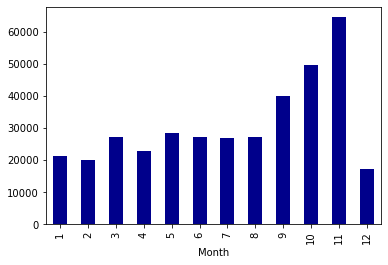

In [17]:
df.groupby(['Month'])['Revenue'].count().plot.bar(color="darkblue")
plt.show()  #Calculate Revenue per month.
### INFERENCE -- 11th month revenue shows highest sales. ##4InvoiceDate

In [30]:
pip install chart-studio

Note: you may need to restart the kernel to use updated packages.


In [31]:
from __future__ import division
from datetime import datetime, timedelta
%matplotlib inline
import matplotlib.pyplot as plt

import seaborn as sns


import chart_studio.plotly as py
import plotly.offline as pyoff
import plotly.graph_objs as go

In [34]:
tx_revenue = df.groupby(['InvoiceDate'])['Revenue'].sum().reset_index()
tx_revenue

,InvoiceDate,Revenue
0,2011-01-04 10:00:00,307.30
1,2011-01-04 10:22:00,474.66
2,2011-01-04 10:23:00,310.28
3,2011-01-04 10:37:00,445.12
4,2011-01-04 10:38:00,190.56
...,...,...
15984,2011-12-09 12:23:00,124.60
15985,2011-12-09 12:25:00,140.64
15986,2011-12-09 12:31:00,329.05
15987,2011-12-09 12:49:00,339.20


In [35]:
plot_data = [
    go.Scatter(
        x=tx_revenue['InvoiceDate'],
        y=tx_revenue['Revenue'],
    )
]

plot_layout = go.Layout(
        xaxis={"type": "category"},
        title='Montly Revenue'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig) ###5 

In [36]:



tx_revenue['MonthlyGrowth'] = tx_revenue['Revenue'].pct_change()

#showing first 5 rows
tx_revenue.head()

#visualization - line graph
plot_data = [
    go.Scatter(
        x=tx_revenue.query("InvoiceDate < 201112")['InvoiceDate'],
        y=tx_revenue.query("InvoiceDate < 201112")['MonthlyGrowth'],
    )
]

plot_layout = go.Layout(
        xaxis={"type": "category"},
        title='Montly Growth Rate'
    )

fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)
## monthly percent change in growth rate ##6.

<AxesSubplot:xlabel='Country'>

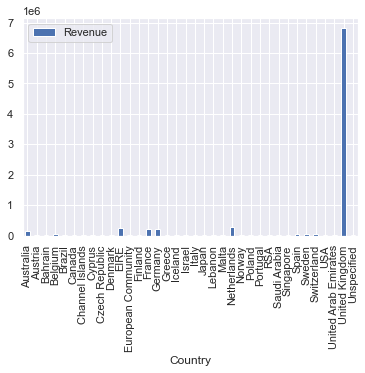

In [27]:
### a. Revenue by country
df_Country = df[["Country", "Revenue"]]
df_Country.groupby("Country").sum().plot(kind="bar") ## 7.

In [47]:
### b.Total active customer(unique count of customer id) by country and month
tx_uk = df.query("Country=='United Kingdom'").reset_index(drop=True)

#creating monthly active customers dataframe by counting unique Customer IDs
tx_monthly_active = tx_uk.groupby('InvoiceDate')['CustomerID'].nunique().reset_index()

#print the dataframe
tx_monthly_active

#plotting the output
plot_data = [
    go.Bar(
        x=tx_monthly_active['InvoiceDate'],
        y=tx_monthly_active['CustomerID'],
    )
]

plot_layout = go.Layout(
        xaxis={"type": "category"},
        title='Monthly Active Customers'
    )

fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)




In [42]:
tx_monthly_sales = tx_uk.groupby('InvoiceDate')['Quantity'].sum().reset_index()

#print the dataframe
tx_monthly_sales

#plot
plot_data = [
    go.Bar(
        x=tx_monthly_sales['InvoiceDate'],
        y=tx_monthly_sales['Quantity'],
    )
]

plot_layout = go.Layout(
        xaxis={"type": "category"},
        title='Monthly Total # of Order'
    )

fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

In [45]:
df.duplicated().sum()

590

In [46]:
df.drop_duplicates(subset=None, keep='first',inplace=True)
df.duplicated().sum()

0

In [48]:
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Revenue,Year,Month,MonthlyGrowth
0,539993,22386,JUMBO BAG PINK POLKADOT,10,2011-01-04 10:00:00,1.95,13313.0,United Kingdom,19.5,2011,1,NaN
1,539993,21499,BLUE POLKADOT WRAP,25,2011-01-04 10:00:00,0.42,13313.0,United Kingdom,10.5,2011,1,-0.461538
2,539993,21498,RED RETROSPOT WRAP,25,2011-01-04 10:00:00,0.42,13313.0,United Kingdom,10.5,2011,1,0.000000
3,539993,22379,RECYCLING BAG RETROSPOT,5,2011-01-04 10:00:00,2.10,13313.0,United Kingdom,10.5,2011,1,0.000000
4,539993,20718,RED RETROSPOT SHOPPER BAG,10,2011-01-04 10:00:00,1.25,13313.0,United Kingdom,12.5,2011,1,0.190476


In [49]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 371137 entries, 0 to 499427
Data columns (total 12 columns):
 #   Column         Non-Null Count   Dtype         
---  ------         --------------   -----         
 0   InvoiceNo      371137 non-null  object        
 1   StockCode      371137 non-null  object        
 2   Description    371137 non-null  object        
 3   Quantity       371137 non-null  int64         
 4   InvoiceDate    371137 non-null  datetime64[ns]
 5   UnitPrice      371137 non-null  float64       
 6   CustomerID     371137 non-null  float64       
 7   Country        371137 non-null  object        
 8   Revenue        371137 non-null  float64       
 9   Year           371137 non-null  int64         
 10  Month          371137 non-null  int64         
 11  MonthlyGrowth  371136 non-null  float64       
dtypes: datetime64[ns](1), float64(4), int64(3), object(4)
memory usage: 36.8+ MB


In [50]:
df.isnull().sum()

InvoiceNo        0
StockCode        0
Description      0
Quantity         0
InvoiceDate      0
UnitPrice        0
CustomerID       0
Country          0
Revenue          0
Year             0
Month            0
MonthlyGrowth    1
dtype: int64

In [51]:
df.Description.isnull().sum()
df.CustomerID.isnull().sum()

0

In [52]:
tx_monthly_order_avg = tx_uk.groupby('InvoiceDate')['Revenue'].mean().reset_index()

#print the dataframe
tx_monthly_order_avg

#plot the bar chart
plot_data = [
    go.Bar(
        x=tx_monthly_order_avg['InvoiceDate'],
        y=tx_monthly_order_avg['Revenue'],
    )
]

plot_layout = go.Layout(
        xaxis={"type": "category"},
        title='Monthly Order Average'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

In [59]:
tx_user_purchase = tx_uk.groupby(['CustomerID','InvoiceDate'])['Revenue'].sum().reset_index()

#create retention matrix with crosstab
tx_retention = pd.crosstab(tx_user_purchase['CustomerID'], tx_user_purchase['InvoiceDate']).reset_index()

tx_retention.head()

#create an array of dictionary which keeps Retained & Total User count for each month
months = tx_retention.columns[2:]
retention_array = []
for i in range(len(months)-1):
    retention_data = {}
    selected_month = months[i+1]
    prev_month = months[i]
    retention_data['InvoiceDate'] = int(selected_month)
    retention_data['TotalUserCount'] = tx_retention[selected_month].sum()
    retention_data['RetainedUserCount'] = tx_retention[(tx_retention[selected_month]>0) & (tx_retention[prev_month]>0)][selected_month].sum()
    retention_array.append(retention_data)
    
#convert the array to dataframe and calculate Retention Rate
tx_retention = pd.DataFrame(retention_array)
tx_retention['RetentionRate'] = tx_retention['RetainedUserCount']/tx_retention['TotalUserCount']

#plot the retention rate graph
plot_data = [
    go.Scatter(
        x=tx_retention.query("InvoiceDate<201112")['InvoiceDate'],
        y=tx_retention.query("InvoiceDate<201112")['RetentionRate'],
        name="organic"
    )
    
]

plot_layout = go.Layout(
        xaxis={"type": "category"},
        title='Monthly Retention Rate'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

KeyError: 'InvoiceDate'

In [ ]:
df

##### customer segmentation:  

In [60]:
LastDate = max(df.InvoiceDate)
LastDate = LastDate + pd.DateOffset(days = 1)

In [61]:
df["Diff"] = LastDate - df.InvoiceDate

In [62]:
recency = df.groupby("CustomerID").Diff.min()
recency = recency.reset_index()
recency.head()

,CustomerID,Diff
0,12346.0,326 days 02:49:00
1,12347.0,2 days 20:58:00
2,12348.0,75 days 23:37:00
3,12349.0,19 days 02:59:00
4,12350.0,310 days 20:49:00


In [63]:
frequency = df.groupby("CustomerID").InvoiceNo.count()
frequency = frequency.reset_index()
frequency.head()

,CustomerID,InvoiceNo
0,12346.0,1
1,12347.0,151
2,12348.0,14
3,12349.0,73
4,12350.0,17


In [64]:
df["Sale"]=df.Quantity*df.UnitPrice
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Revenue,Year,Month,MonthlyGrowth,Diff,Sale
0,539993,22386,JUMBO BAG PINK POLKADOT,10,2011-01-04 10:00:00,1.95,13313.0,United Kingdom,19.5,2011,1,NaN,340 days 02:50:00,19.5
1,539993,21499,BLUE POLKADOT WRAP,25,2011-01-04 10:00:00,0.42,13313.0,United Kingdom,10.5,2011,1,-0.461538,340 days 02:50:00,10.5
2,539993,21498,RED RETROSPOT WRAP,25,2011-01-04 10:00:00,0.42,13313.0,United Kingdom,10.5,2011,1,0.000000,340 days 02:50:00,10.5
3,539993,22379,RECYCLING BAG RETROSPOT,5,2011-01-04 10:00:00,2.10,13313.0,United Kingdom,10.5,2011,1,0.000000,340 days 02:50:00,10.5
4,539993,20718,RED RETROSPOT SHOPPER BAG,10,2011-01-04 10:00:00,1.25,13313.0,United Kingdom,12.5,2011,1,0.190476,340 days 02:50:00,12.5


In [65]:
monetry = df.groupby("CustomerID").Sale.sum()
monetry = monetry.reset_index()
monetry.head()

,CustomerID,Sale
0,12346.0,77183.60
1,12347.0,3598.21
2,12348.0,904.44
3,12349.0,1757.55
4,12350.0,334.40


In [66]:
rmf = monetry.merge(frequency, on = "CustomerID")
rmf = rmf.merge(recency, on = "CustomerID")
rmf.columns = ["CustomerID", "Monetry", "Frequence", "Recency"]
rmf

,CustomerID,Monetry,Frequence,Recency
0,12346.0,77183.60,1,326 days 02:49:00
1,12347.0,3598.21,151,2 days 20:58:00
2,12348.0,904.44,14,75 days 23:37:00
3,12349.0,1757.55,73,19 days 02:59:00
4,12350.0,334.40,17,310 days 20:49:00
...,...,...,...,...
4214,18280.0,180.60,10,278 days 02:58:00
4215,18281.0,80.82,7,181 days 01:57:00
4216,18282.0,178.05,12,8 days 01:07:00
4217,18283.0,2080.67,745,4 days 00:48:00


In [67]:
RMF1 = rmf.drop("CustomerID", axis = 1)
RMF1.Recency = RMF1.Recency.dt.days
RMF1.head()

,Monetry,Frequence,Recency
0,77183.60,1,326
1,3598.21,151,2
2,904.44,14,75
3,1757.55,73,19
4,334.40,17,310


In [68]:
RMF1 = pd.DataFrame(RMF1, columns=["Monetry", "Frequence", "Recency"])
RMF1

,Monetry,Frequence,Recency
0,77183.60,1,326
1,3598.21,151,2
2,904.44,14,75
3,1757.55,73,19
4,334.40,17,310
...,...,...,...
4214,180.60,10,278
4215,80.82,7,181
4216,178.05,12,8
4217,2080.67,745,4


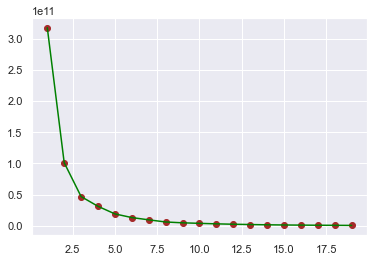

In [69]:
from sklearn.cluster import KMeans
#Training the data and fitting 
#Finding inertias for a range of k values
ssd = []
for k in range(1, 20):
    km = KMeans(n_clusters=k)
    km.fit(RMF1)
    ssd.append(km.inertia_)
#Plotting the inertia's wrt 'k' values 
plt.plot(np.arange(1,20), ssd, color = "green")
plt.scatter(np.arange(1,20), ssd, color = "brown")
plt.show()

In [70]:
#Training with KMeans and predicting the ClusterID.
model = KMeans(n_clusters=5)
ClusterID = model.fit_predict(RMF1)
RMF1["ClusterID"] = ClusterID
RMF1

,Monetry,Frequence,Recency,ClusterID
0,77183.60,1,326,2
1,3598.21,151,2,0
2,904.44,14,75,0
3,1757.55,73,19,0
4,334.40,17,310,0
...,...,...,...,...
4214,180.60,10,278,0
4215,80.82,7,181,0
4216,178.05,12,8,0
4217,2080.67,745,4,0


In [72]:
km_cluster_sale = RMF1.groupby("ClusterID").Monetry.mean()
km_cluster_Recency = RMF1.groupby("ClusterID").Recency.mean()
km_cluster_Frequence = RMF1.groupby("ClusterID").Frequence.mean()

<AxesSubplot:ylabel='Recency'>

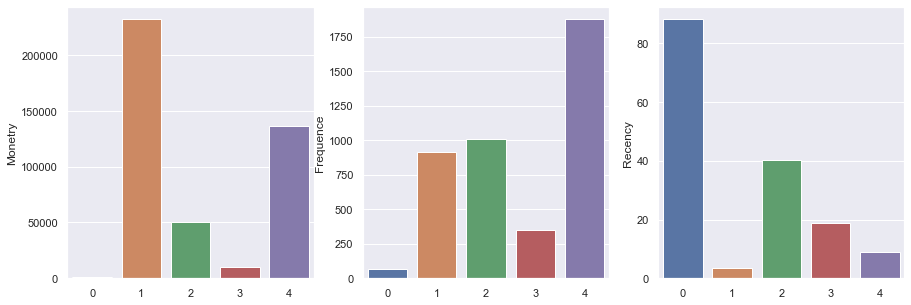

In [75]:



fig, axs = plt.subplots(1,3, figsize = (15, 5))
sns.barplot(x = [0,1,2,3,4],  y = km_cluster_sale , ax = axs[0])
sns.barplot(x = [0,1,2,3,4],  y = km_cluster_Frequence , ax = axs[1])
sns.barplot(x = [0,1,2,3,4],  y = km_cluster_Recency , ax = axs[2])

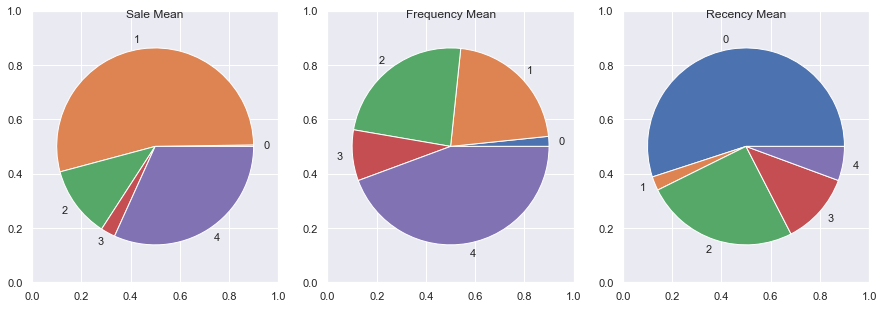

In [76]:
fig, axs = plt.subplots(1,3, figsize = (15, 5))

ax1 = fig.add_subplot(1, 3, 1)
plt.title("Sale Mean")
ax1.pie(km_cluster_sale, labels = [0,1,2,3,4])

ax1 = fig.add_subplot(1, 3, 2)
plt.title("Frequency Mean")
ax1.pie(km_cluster_Frequence, labels = [0,1,2,3,4])

ax1 = fig.add_subplot(1, 3, 3)
plt.title("Recency Mean")
ax1.pie(km_cluster_Recency, labels = [0,1,2,3,4])



plt.axis("off")
plt.show()

In [ ]:
Group 1,4 are loyal customers.No need of any target marketing as their frequency,investing amount is more though recency is less.
Group 0,3 are useless customers as they just visit and dont spend money.
Group 2 customers are spending less.If we do target marketing,is a chance ofincreasing their investment.
Finally,Segmentation of customers is done using K-means Algorithm.

